<a href="https://colab.research.google.com/github/Praneet9/Plant_Monitor/blob/master/Potatoes_Test/Plant_Monitoring_vgg16.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!wget http://92afa770.ngrok.io/dataset.zip

--2019-01-07 02:19:17--  http://92afa770.ngrok.io/dataset.zip
Resolving 92afa770.ngrok.io (92afa770.ngrok.io)... 52.15.72.79, 2600:1f16:59e:b200:f152:bf63:c2ce:89d4
Connecting to 92afa770.ngrok.io (92afa770.ngrok.io)|52.15.72.79|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 62190494 (59M) [application/zip]
Saving to: ‘dataset.zip’

dataset.zip         100%[===================>]  59.31M   715KB/s    in 3m 3s   

2019-01-07 02:22:23 (333 KB/s) - ‘dataset.zip’ saved [62190494/62190494]



In [0]:
!unzip dataset.zip

In [4]:
ls

dataset/  dataset.zip  sample_data/


In [1]:
import numpy as np
import tensorflow as tf
import cv2
import os
import matplotlib.pyplot as plt

import keras

from keras.models import Sequential, Model
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout, Input
from keras.utils import to_categorical
from keras.optimizers import SGD, RMSprop, adadelta, Adam

from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint

Using TensorFlow backend.


In [0]:
img_rows = 224
img_cols = 224
num_channels = 3
epochs = 5
num_classes = 3

In [0]:
from keras import backend as K
K.set_image_dim_ordering('tf')

In [0]:
from keras.applications import vgg16

In [0]:
input_layer = Input(shape=(img_rows, img_cols, num_channels))

In [0]:
vgg_model = vgg16.VGG16(include_top=False, weights='imagenet', input_tensor=input_layer)

In [7]:
vgg_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [18]:
# image_input = Input(shape=(224, 224, 3))

# model = vgg16.VGG16(input_tensor=image_input, include_top=True,weights='imagenet')

# model.summary()

# last_layer = model.get_layer('block5_pool').output
# x = Conv2D(256, (3, 3), strides=(1, 1), activation='relu')(last_layer)
# model = Conv2D(256, (3, 3), strides=(1, 1), activation='relu')(x)
# model = Conv2D(256, (3, 3), strides=(1, 1), activation='relu')(model)
# model = MaxPooling2D(pool_size=(2, 2))(model)
# x= Flatten(name='flatten')(model)
# x = Dense(128, activation='relu', name='fc1')(x)
# x = Dense(128, activation='relu', name='fc2')(x)
# out = Dense(num_classes, activation='softmax', name='output')(x)
# custom_vgg_model2 = Model(image_input, out)
# custom_vgg_model2.summary()

# # freeze all the layers except the dense layers
# for layer in custom_vgg_model2.layers[:-3]:
# 	layer.trainable = False

# custom_vgg_model2.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

ValueError: ignored

In [0]:
for i in range(4):
  vgg_model.layers.pop()

In [0]:
for layer in vgg_model.layers:
  layer.trainable = False

In [0]:
last_layer = vgg_model.get_layer('block4_pool').output

In [11]:
conv_1 = Conv2D(256, (3, 3), strides=(1, 1), activation='relu')(last_layer)
conv_2 = Conv2D(256, (3, 3), strides=(1, 1), activation='relu')(conv_1)
conv_3 = Conv2D(256, (3, 3), strides=(1, 1), activation='relu')(conv_2)
maxpool1 = MaxPooling2D(pool_size=(2, 2))(conv_3)

conv_4 = Conv2D(256, (3, 3), strides=(1, 1), activation='relu')(maxpool1)
maxpool2 = MaxPooling2D(pool_size=(2, 2))(conv_4)

flatten = Flatten()(maxpool2)

dense_1 = Dense(512, activation='relu')(flatten)
dense_2 = Dense(512, activation='relu')(dense_1)

output = Dense(num_classes, activation='softmax', name='output')(dense_2)

custom_vgg_model = Model(input_layer, output)
custom_vgg_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0         
__________

In [12]:
train_datagen = ImageDataGenerator(
        rescale=1./255,
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        shear_range=0.4,
        zoom_range=0.5,
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        # randomly rotate images in the range (degrees, 0 to 180)
        rotation_range=180,
        # randomly shift images horizontally (fraction of total width)
        width_shift_range=0.4,
        # randomly shift images vertically (fraction of total height)
        height_shift_range=0.4,
        horizontal_flip=True,  # randomly flip images
        vertical_flip=True)  # randomly flip images

test_datagen = ImageDataGenerator(
        rescale=1./255,
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        shear_range=0.4,
        zoom_range=0.5,
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        # randomly rotate images in the range (degrees, 0 to 180)
        rotation_range=180,
        # randomly shift images horizontally (fraction of total width)
        width_shift_range=0.4,
        # randomly shift images vertically (fraction of total height)
        height_shift_range=0.4,
        horizontal_flip=True,  # randomly flip images
        vertical_flip=True)  # randomly flip images

train_generator = train_datagen.flow_from_directory(
        'dataset/train',
        target_size=(img_rows, img_cols),
        color_mode="rgb",
        batch_size=32,
        class_mode="categorical",
        shuffle=True,)

test_generator = test_datagen.flow_from_directory(
        'dataset/test',
        target_size=(img_rows, img_cols),
        color_mode="rgb",
        batch_size=32,
        class_mode="categorical",
        shuffle=True,)

Found 5563 images belonging to 3 classes.
Found 1089 images belonging to 3 classes.


In [0]:
augmented_checkpoint = ModelCheckpoint('augmented_best_model.hdf5',  # model filename
                                       monitor='val_loss',  # quantity to monitor
                                       verbose=1,  # verbosity - 0 or 1
                                       save_best_only=True,  # The latest best model will not be overwritten
                                       mode='auto')  # The decision to overwrite model is made
# automatically depending on the quantity to monitor

In [0]:
custom_vgg_model.compile(loss=keras.losses.categorical_crossentropy,  # Better loss function for neural networks
              optimizer=keras.optimizers.Adam(),  # Adam optimizer with 1.0e-4 learning rate
              metrics=['accuracy'])  # Metrics to be evaluated by the model

In [16]:
custom_vgg_model.fit_generator(generator=train_generator,
                    validation_data=test_generator,
                    epochs=epochs,
                    callbacks=[augmented_checkpoint],
                    verbose=1,
                    steps_per_epoch=128,
                    validation_steps=64,
)

Epoch 1/5
128/128 [==============================] - 100s 781ms/step - loss: 0.9360 - acc: 0.5476 - val_loss: 0.9750 - val_acc: 0.6148

Epoch 00001: val_loss improved from inf to 0.97505, saving model to augmented_best_model.hdf5
Epoch 2/5
128/128 [==============================] - 93s 723ms/step - loss: 0.6692 - acc: 0.6958 - val_loss: 0.8034 - val_acc: 0.6375

Epoch 00002: val_loss improved from 0.97505 to 0.80341, saving model to augmented_best_model.hdf5
Epoch 3/5
128/128 [==============================] - 92s 720ms/step - loss: 0.5774 - acc: 0.7406 - val_loss: 0.6096 - val_acc: 0.7276

Epoch 00003: val_loss improved from 0.80341 to 0.60963, saving model to augmented_best_model.hdf5
Epoch 4/5
128/128 [==============================] - 92s 718ms/step - loss: 0.5204 - acc: 0.7795 - val_loss: 0.5275 - val_acc: 0.7664

Epoch 00004: val_loss improved from 0.60963 to 0.52747, saving model to augmented_best_model.hdf5
Epoch 5/5
128/128 [==============================] - 91s 715ms/step - l

In [0]:
%matplotlib inline

import glob
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import imageio as im
from keras import models
from keras.preprocessing import image

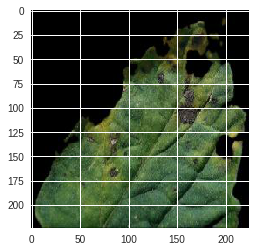

In [19]:
img_path = 'dataset/train/Early_blight/0012b9d2-2130-4a06-a834-b1f3af34f57e___RS_Erly.B 8389_final_masked.jpg'

img = image.load_img(img_path, target_size=(img_rows, img_cols))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

plt.imshow(img_tensor[0])
plt.show()

In [0]:
layer_outputs = [layer.output for layer in custom_vgg_model.layers[1:]] # Extracts the outputs of the top 12 layers
activation_model = models.Model(inputs=custom_vgg_model.input, outputs=layer_outputs) # Creates a model that will return these outputs, given the model input

In [0]:
activations = activation_model.predict(img_tensor) # Returns a list of five Numpy arrays: one array per layer activation

In [29]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 224, 224, 64)


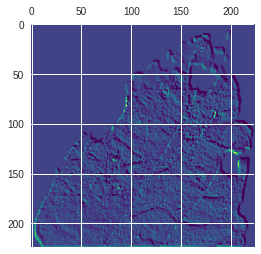

Exception ignored in: <bound method BaseSession._Callable.__del__ of <tensorflow.python.client.session.BaseSession._Callable object at 0x7f87c3b58ba8>>
Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/tensorflow/python/client/session.py", line 1455, in __del__
    self._session._session, self._handle, status)
  File "/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/errors_impl.py", line 528, in __exit__
    c_api.TF_GetCode(self.status.status))
tensorflow.python.framework.errors_impl.InvalidArgumentError: No such callable handle: 108540792


In [30]:
plt.matshow(first_layer_activation[0, :, :, 4], cmap='viridis')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in true_divide


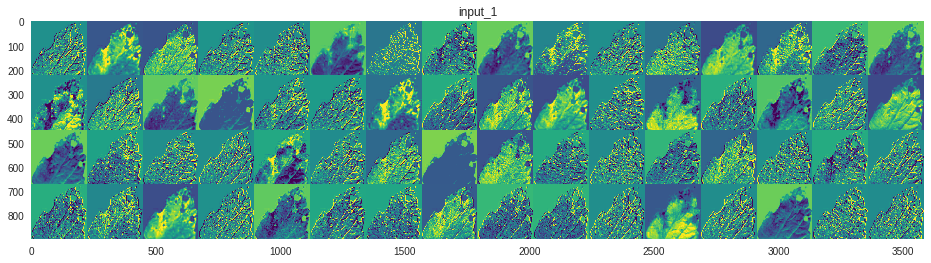

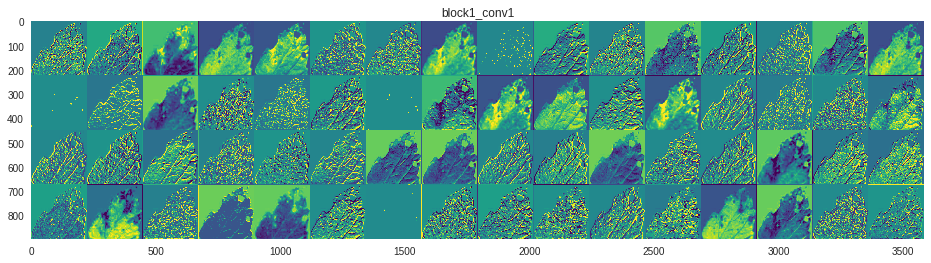

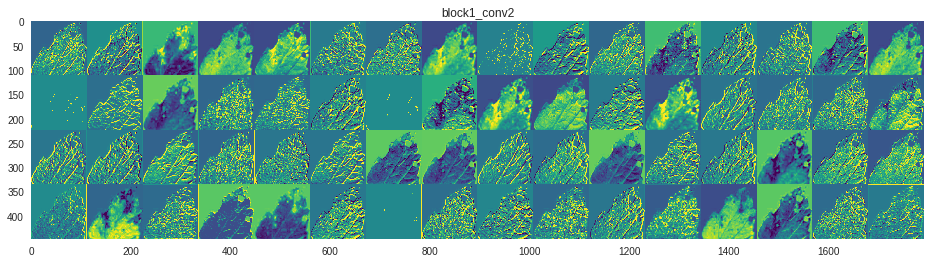

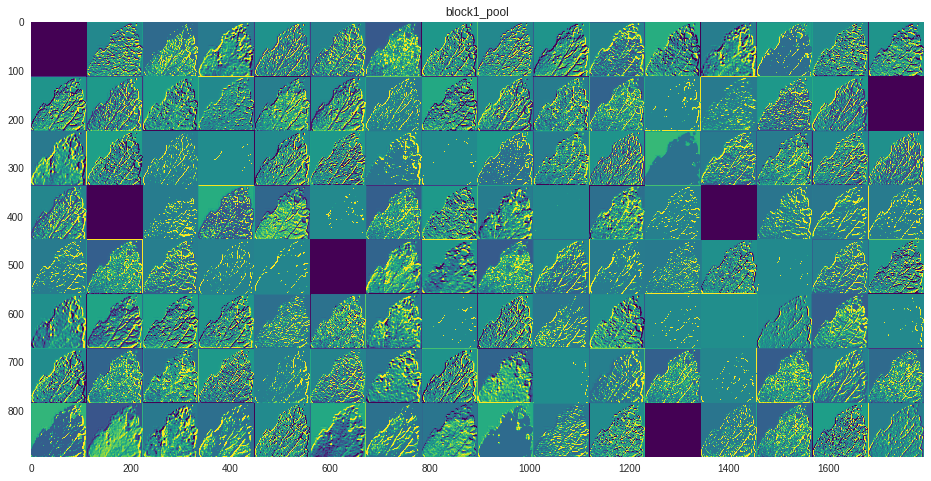

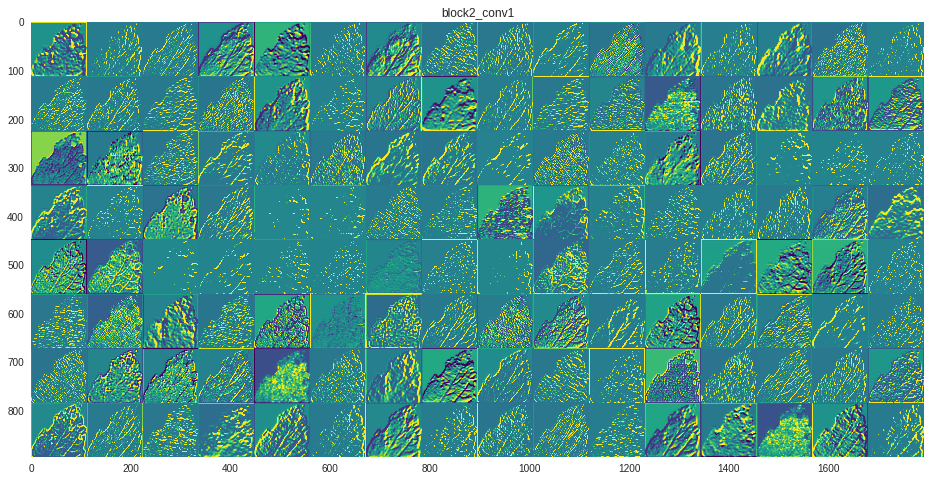

...

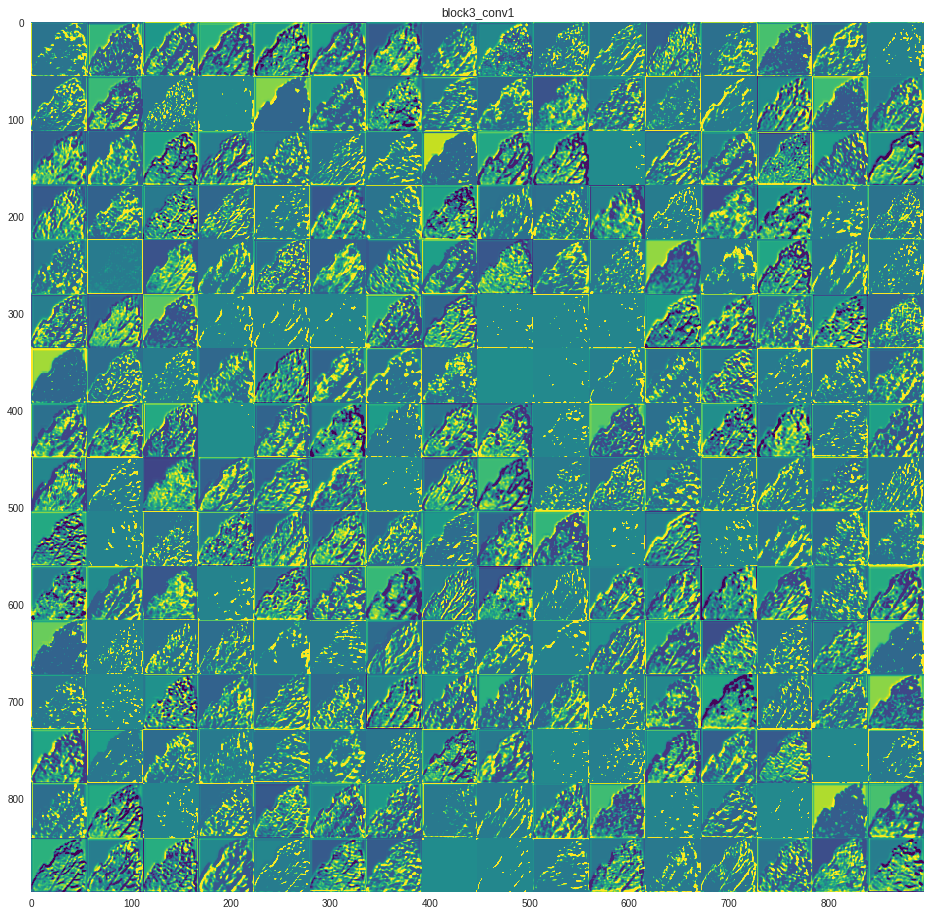

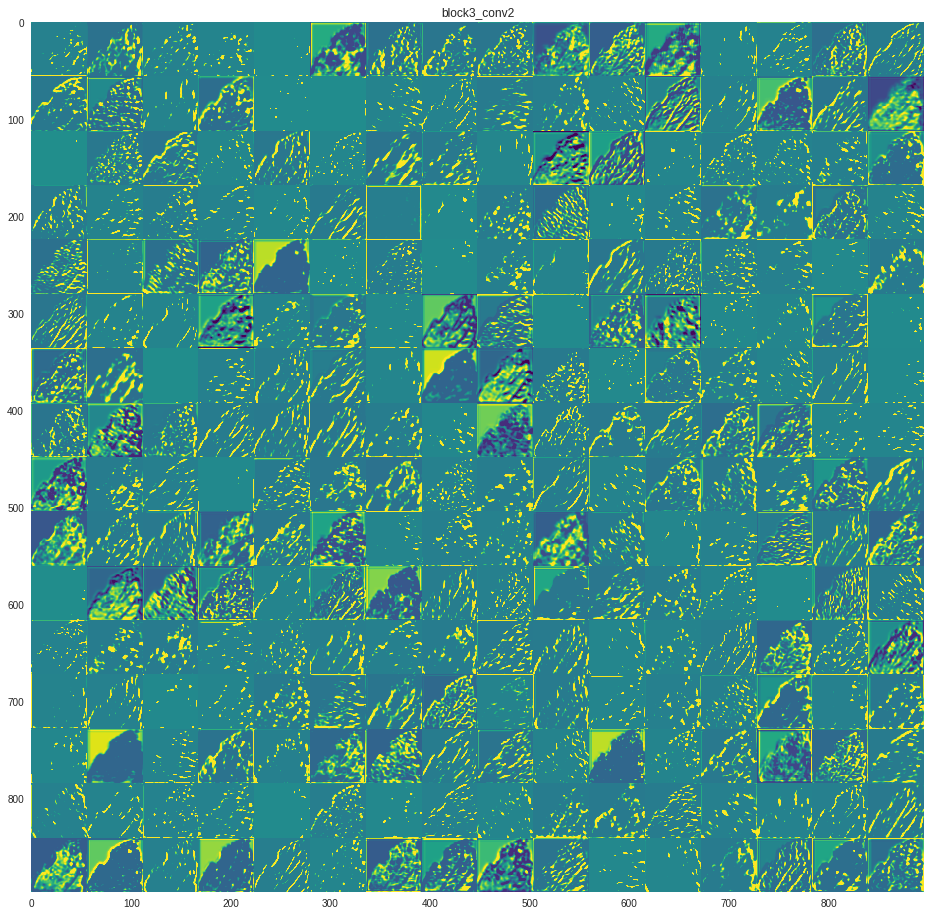

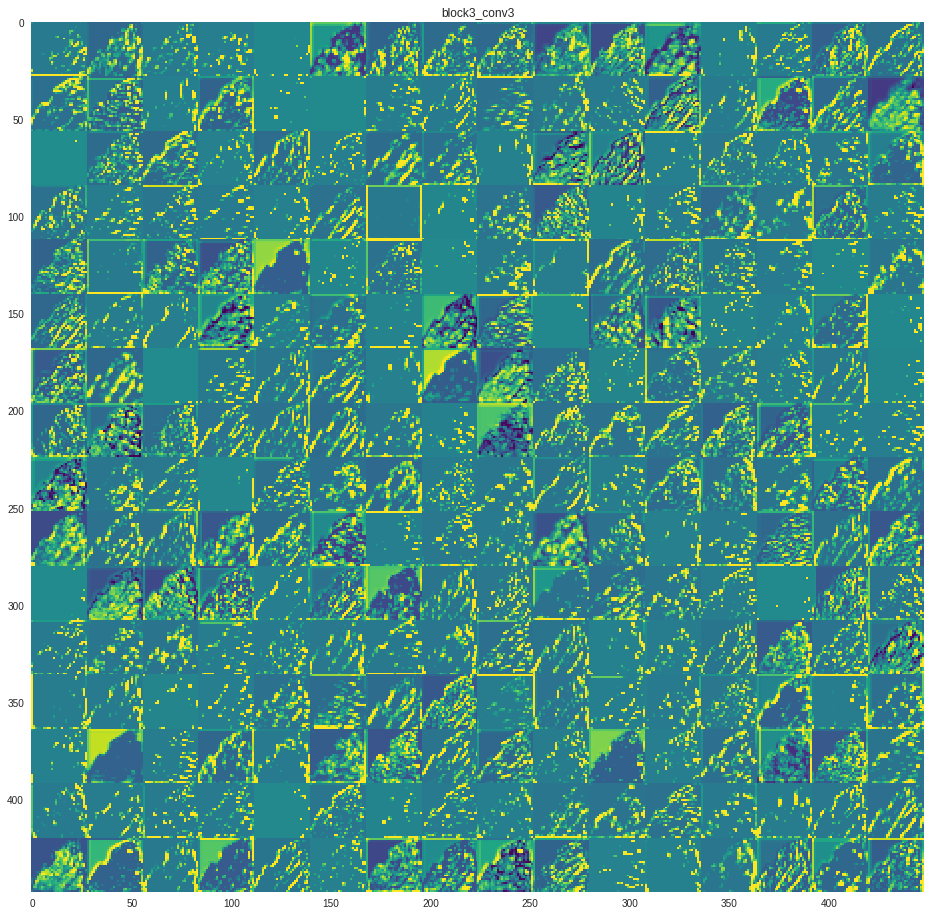

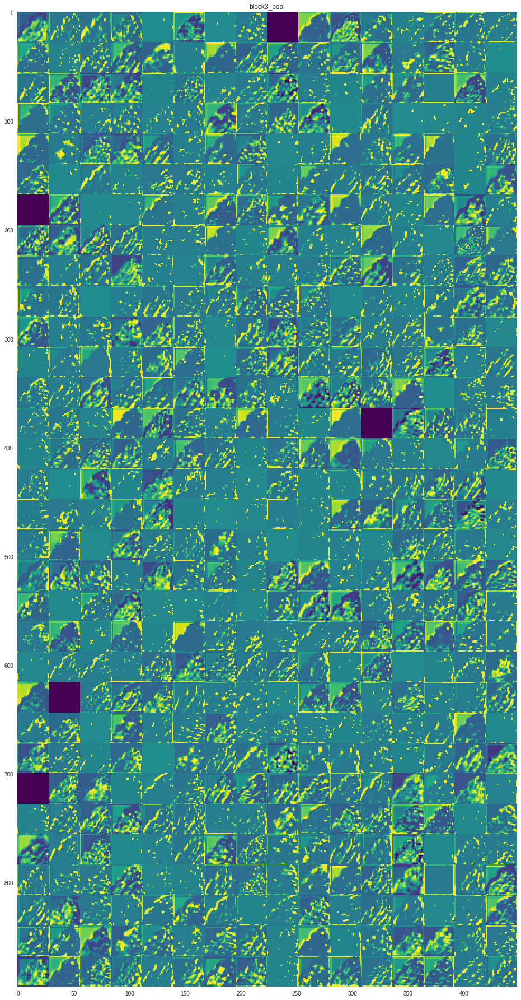

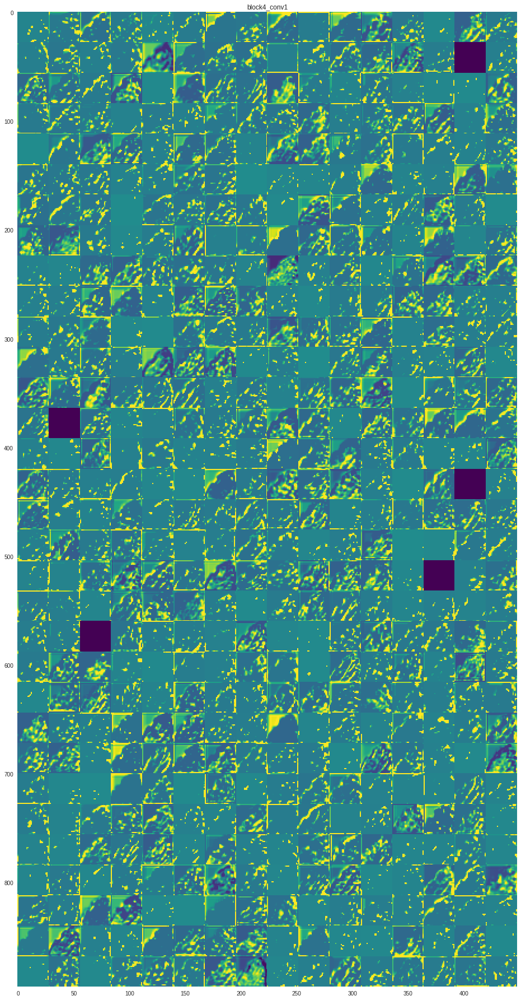

In [31]:
layer_names = []
for layer in custom_vgg_model.layers[:12]:
    layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot
    
images_per_row = 16

for layer_name, layer_activation in zip(layer_names, activations): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')